#  Business Case 3

## Data import and preprocessing

In [ ]:
# Mount drive
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Fintech/Business Case 3/

Mounted at /gdrive
/gdrive/My Drive/Fintech/Business Case 3


In [ ]:
!ls

FinancialMarketData.xlsx


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Data import

In [ ]:
file_path = 'FinancialMarketData.xlsx'
df = pd.read_excel(file_path, sheet_name='EWS')
print(df.head())

   Y       Data  XAU BGNL  ECSURPUS  BDIY     CRY     DXY     JPY     GBP  \
0  0 2000-01-11    283.25     0.077  1388  157.26  100.56  105.86  1.6460   
1  0 2000-01-18    287.65     0.043  1405  165.01  101.86  105.47  1.6383   
2  0 2000-01-25    287.15     0.135  1368  167.24  102.41  106.04  1.6496   
3  0 2000-02-01    282.75     0.191  1311  166.85  104.92  107.85  1.6106   
4  1 2000-02-08    298.40     0.312  1277  165.43  104.22  109.30  1.6108   

     Cl1  ...  LP01TREU  EMUSTRUU  LF94TRUU     MXUS    MXEU     MXJP    MXBR  \
0  25.77  ...  116.4635  230.5267  123.7616  1416.12  127.75   990.59  856.76   
1  28.85  ...  117.2674  231.3770  123.7616  1428.79  129.50   993.98  925.22   
2  28.28  ...  117.9946  232.3895  123.7616  1385.93  126.48   974.83  886.93   
3  28.22  ...  120.5100  231.9417  122.3281  1385.31  129.19  1007.12  842.60   
4  28.02  ...  118.7914  237.8117  122.3281  1411.95  134.67  1034.58  945.15   

     MXRU    MXIN   MXCN  
0  224.33  217.34  34.3

In [ ]:
# Check for duplicates
duplicates = df.duplicated().sum()
if duplicates > 0:
    print("There are {} duplicate rows in the DataFrame.".format(duplicates))
else:
    print("There are no duplicate rows in the DataFrame.")

There are no duplicate rows in the DataFrame.


In [ ]:
# Check for NaNs
nan_values = df.isna().sum().sum()
if nan_values > 0:
    print("There are {} NaN values in the DataFrame.".format(nan_values))
else:
    print("There are no NaN values in the DataFrame.")

There are no NaN values in the DataFrame.


In [ ]:
df.columns[1:]

Index(['Data', 'XAU BGNL', 'ECSURPUS', 'BDIY', 'CRY', 'DXY', 'JPY', 'GBP',
       'Cl1', 'VIX', 'USGG30YR', 'GT10', 'USGG2YR', 'USGG3M', 'US0001M',
       'GTDEM30Y', 'GTDEM10Y', 'GTDEM2Y', 'EONIA', 'GTITL30YR', 'GTITL10YR',
       'GTITL2YR', 'GTJPY30YR', 'GTJPY10YR', 'GTJPY2YR', 'GTGBP30Y',
       'GTGBP20Y', 'GTGBP2Y', 'LUMSTRUU', 'LMBITR', 'LUACTRUU', 'LF98TRUU',
       'LG30TRUU', 'LP01TREU', 'EMUSTRUU', 'LF94TRUU', 'MXUS', 'MXEU', 'MXJP',
       'MXBR', 'MXRU', 'MXIN', 'MXCN'],
      dtype='object')

In [ ]:
# Convert 'Data' column to datetime
df['Data'] = pd.to_datetime(df['Data'])

# Set 'Data' column as index
df.set_index('Data', inplace=True)

In [ ]:
# Define indices, currencies, and interest rate columns
indices_currencies_cols = ['XAU BGNL', 'BDIY', 'CRY', 'Cl1', 'DXY', 'EMUSTRUU', 'GBP', 'JPY',
                           'LF94TRUU', 'LF98TRUU', 'LG30TRUU', 'LMBITR', 'LP01TREU', 'LUACTRUU',
                           'LUMSTRUU', 'MXBR', 'MXCN', 'MXEU', 'MXIN', 'MXJP', 'MXRU', 'MXUS', 'VIX']

interest_rates_cols = ['EONIA', 'GTDEM10Y', 'GTDEM2Y', 'GTDEM30Y', 'GTGBP20Y', 'GTGBP2Y', 'GTGBP30Y',
                       'GTITL10YR', 'GTITL2YR', 'GTITL30YR', 'GTJPY10YR', 'GTJPY2YR', 'GTJPY30YR',
                       'US0001M', 'USGG3M', 'USGG2YR', 'GT10', 'USGG30YR']

# Create DataFrame df_diff
df_diff = pd.DataFrame()

small_constant = 1e-10  # You can adjust this value as needed

# Copy 'Y' to df_diff
df_diff['Y'] = df['Y']
df_diff['ECSURPUS'] = np.log(df['ECSURPUS'] + small_constant)

# Scale and add log-differences for indices and currencies columns
for col in indices_currencies_cols:
    df_diff[col] = np.log(df[col]).diff()

# Add first differences for interest rate columns
for col in interest_rates_cols:
    df_diff[col] = df[col].diff()

# Drop the first row as it contains NaN values due to differencing
df_diff = df_diff.dropna()

# Display the resulting DataFrame
print(df_diff)

            Y  ECSURPUS  XAU BGNL      BDIY       CRY       Cl1       DXY  \
Data                                                                        
2000-01-18  0 -3.146555  0.015415  0.012173  0.048106  0.112899  0.012845   
2000-01-25  0 -2.002480 -0.001740 -0.026687  0.013424 -0.019955  0.005385   
2000-02-01  0 -1.655482 -0.015442 -0.042560 -0.002335 -0.002124  0.024214   
2000-02-08  1 -1.164752  0.053872 -0.026277 -0.008547 -0.007112 -0.006694   
2000-02-15  1 -0.939048  0.018264  0.086946  0.024777  0.070277  0.004500   
...        ..       ...       ...       ...       ...       ...       ...   
2021-03-23  0 -1.081755 -0.000706  0.118609 -0.047253 -0.115009  0.005114   
2021-03-30  0 -1.194022 -0.024844 -0.076855  0.002014  0.047173  0.010354   
2021-04-06  0 -0.820981  0.033671 -0.005244  0.005207 -0.020354 -0.010365   
2021-04-13  0 -0.761426 -0.000338  0.022685  0.012287  0.014225 -0.005245   
2021-04-20  0 -0.709277  0.021026  0.127908  0.029675  0.037826 -0.007705   

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


## Plots

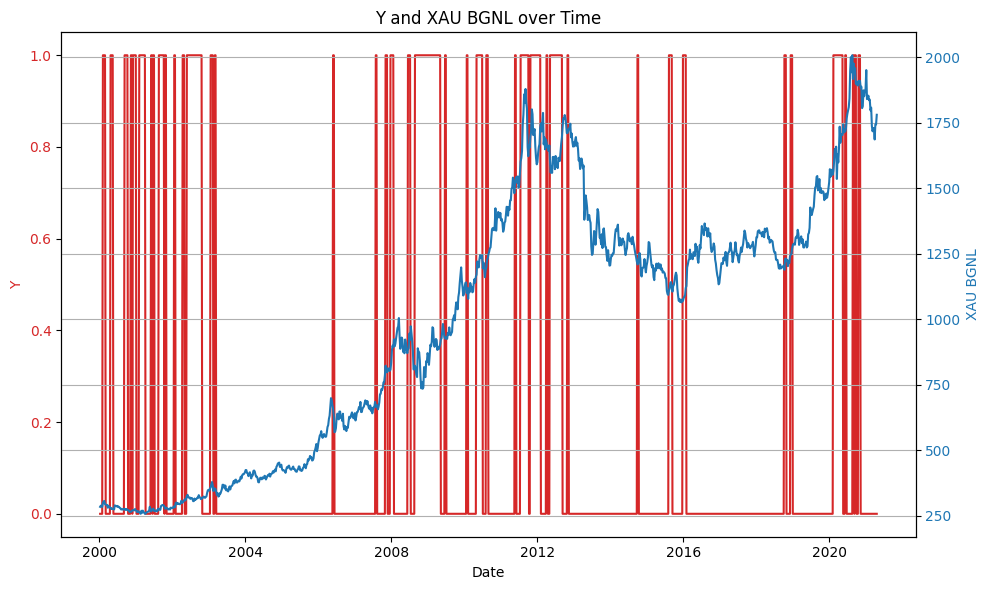

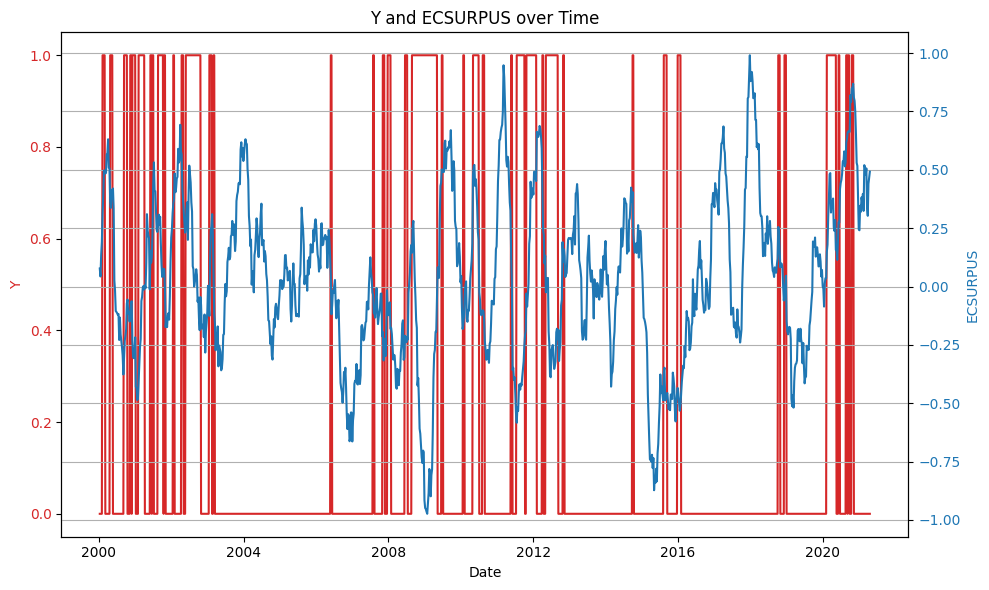

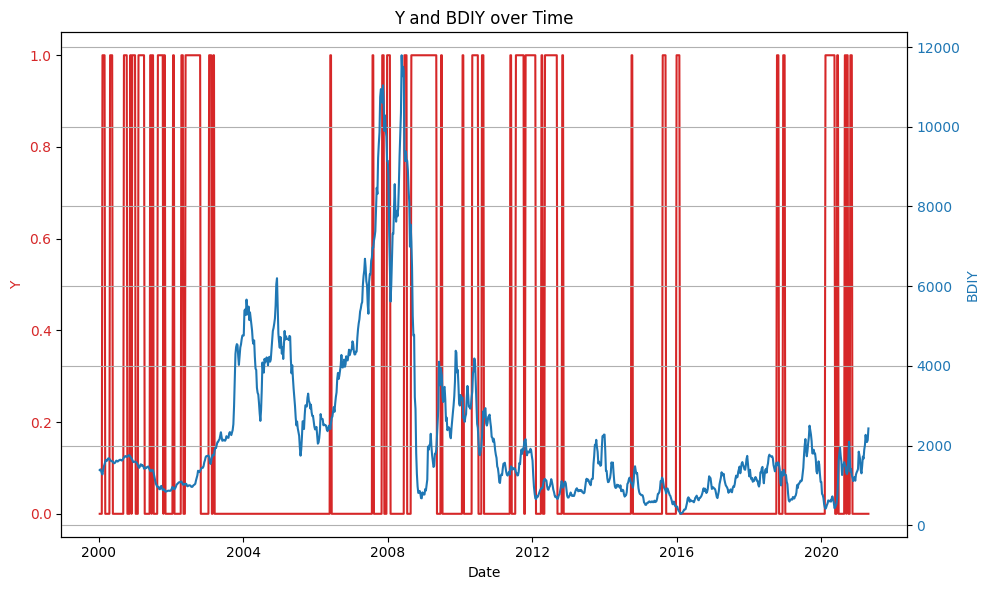

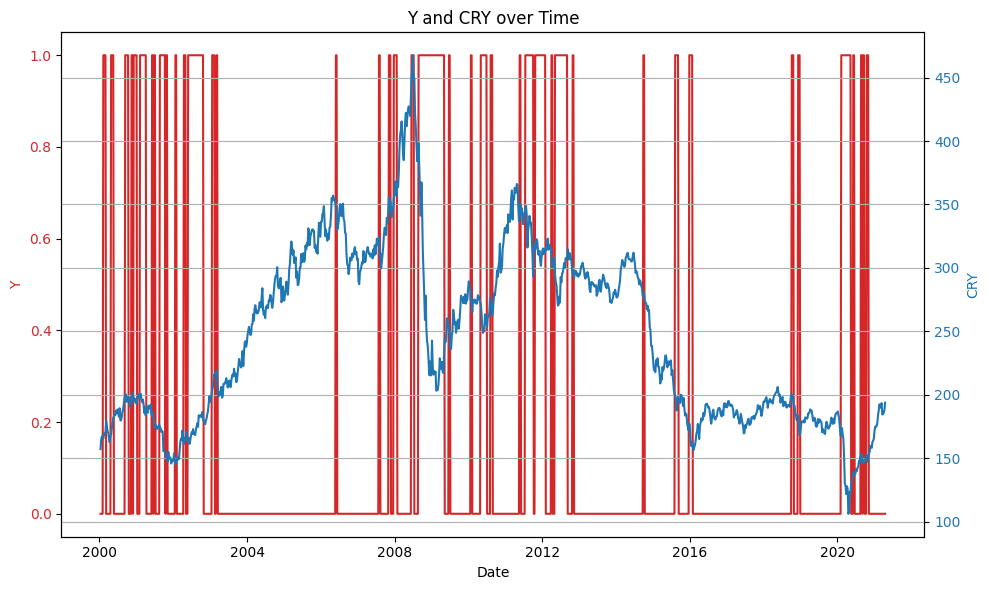

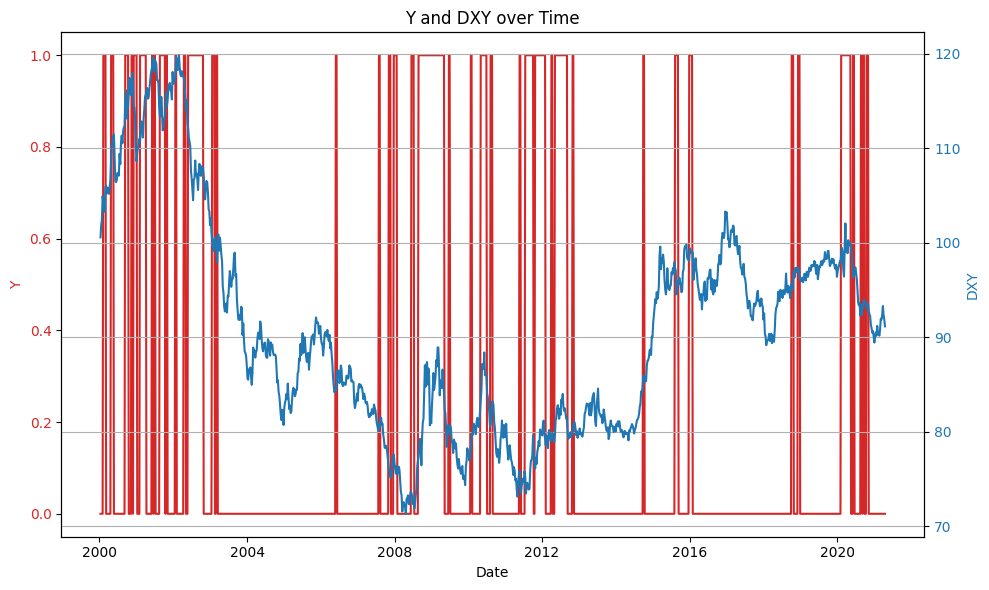

...

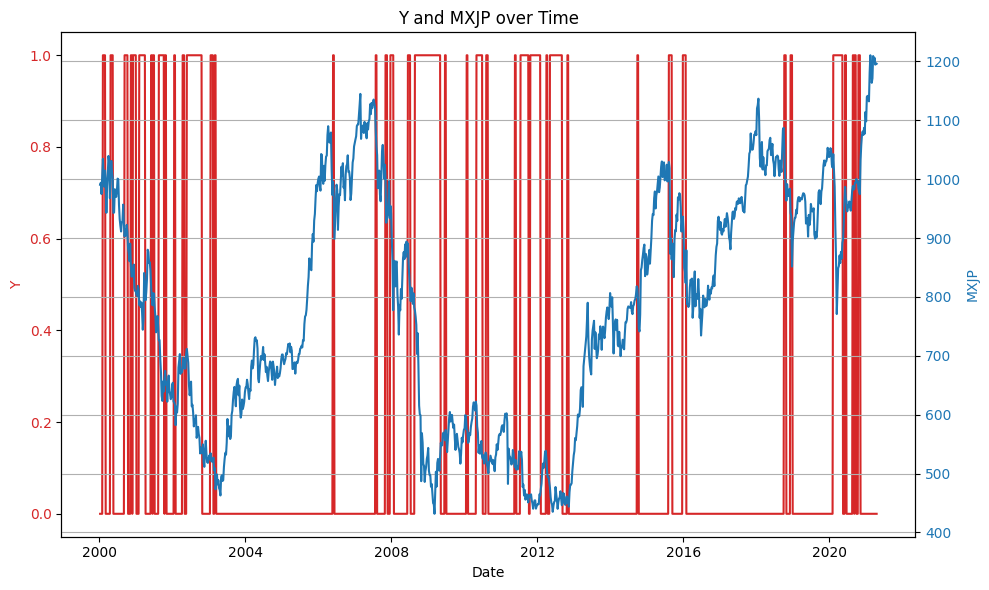

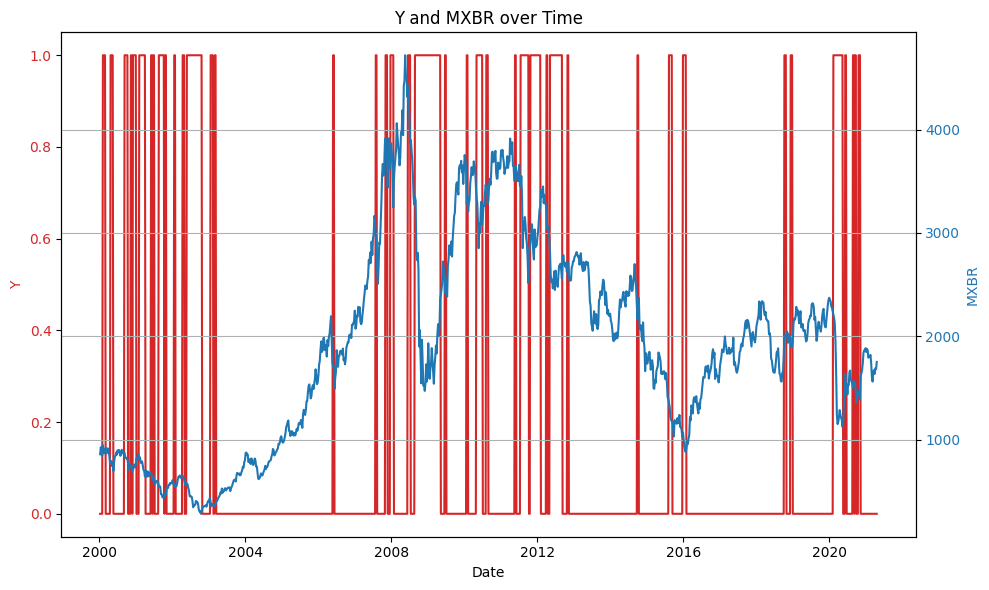

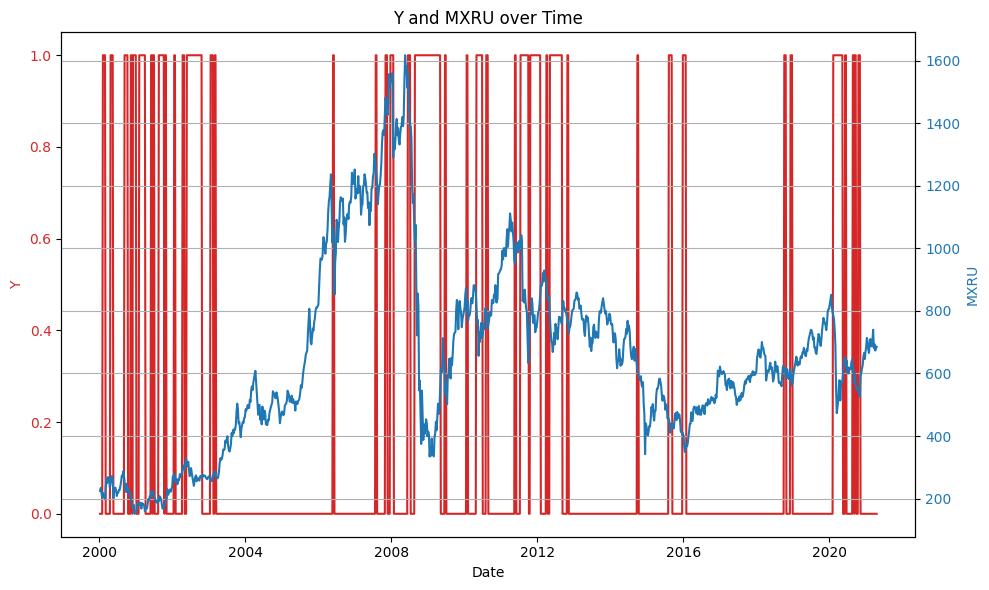

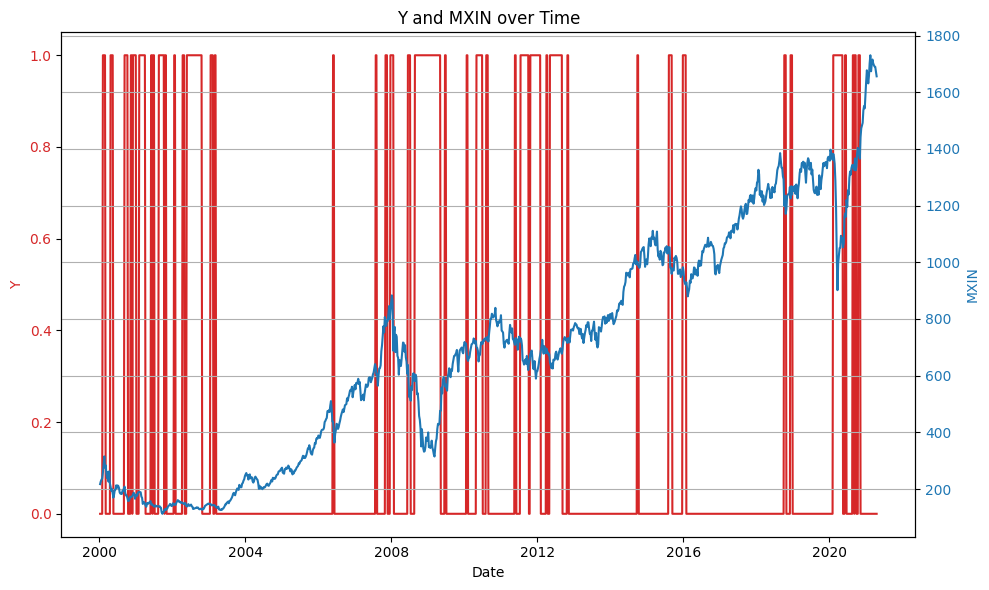

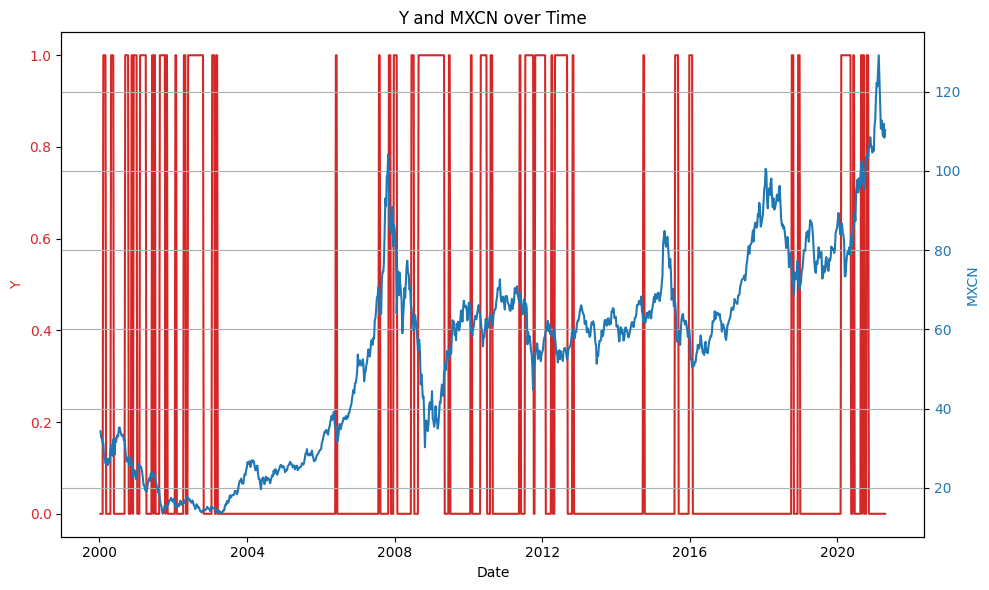

In [ ]:
for col in df.columns[1:]:
    # Plotting
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot Y over time
    color = 'tab:red'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Y', color=color)
    ax1.plot(df.index, df['Y'], linestyle='-', color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    # Create a second y-axis for the current column
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel(col, color=color)
    ax2.plot(df.index, df[col], linestyle='-', color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f'Y and {col} over Time')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

gaussianity of first differences

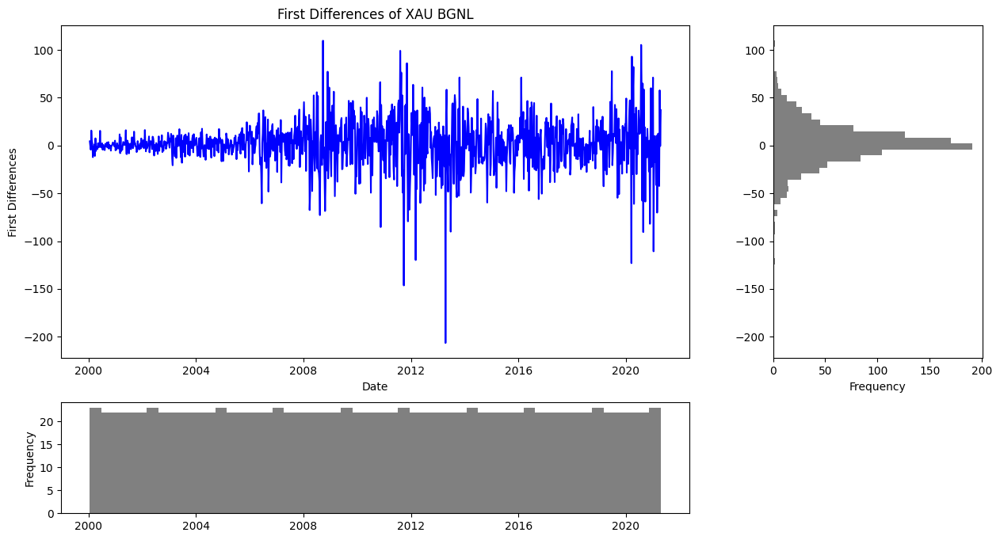

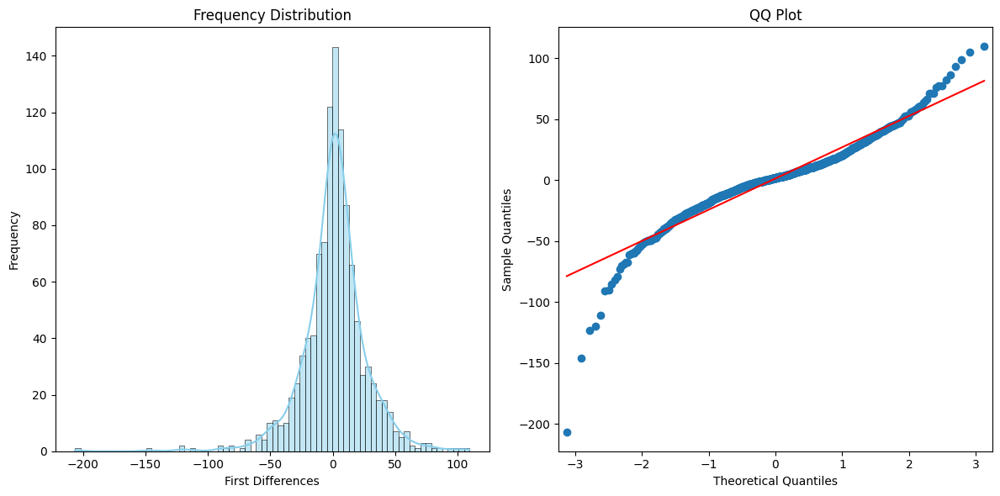

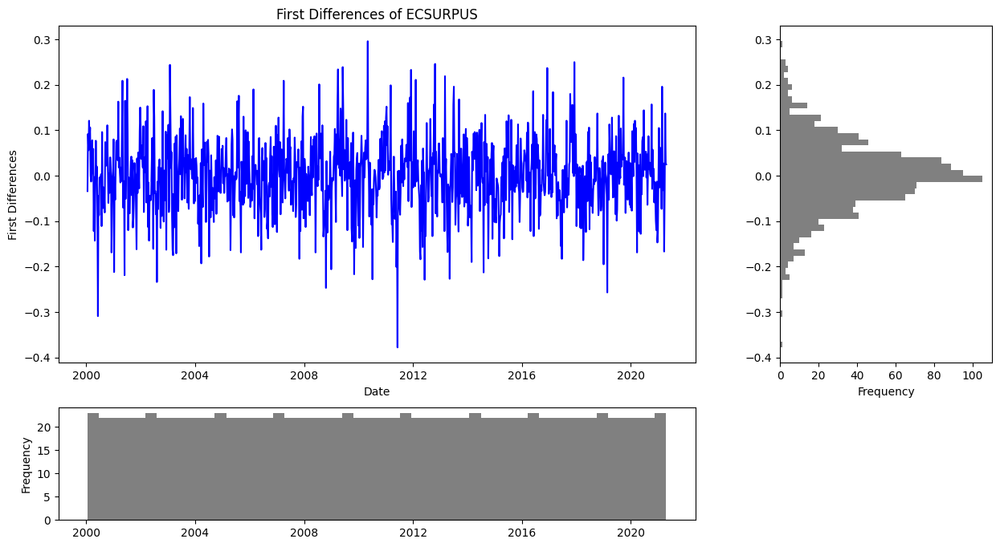

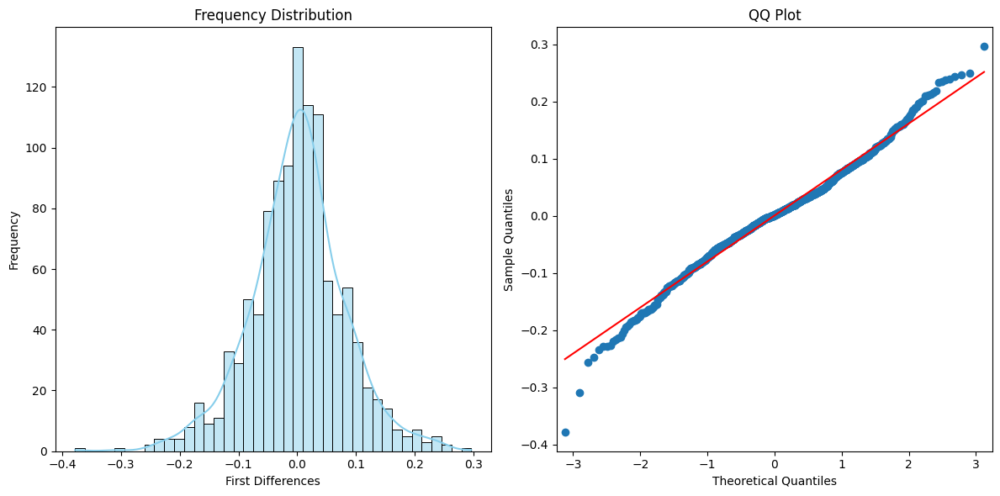

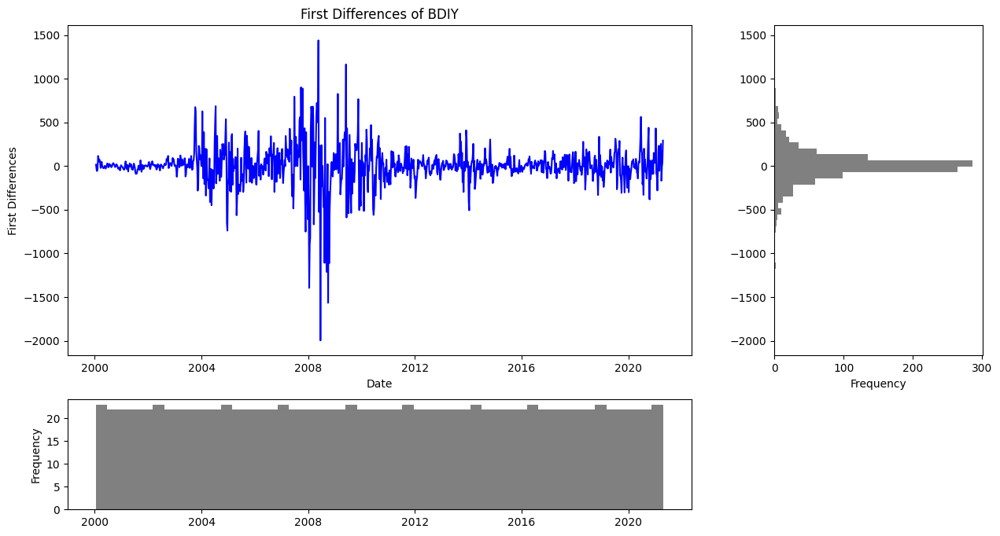

...

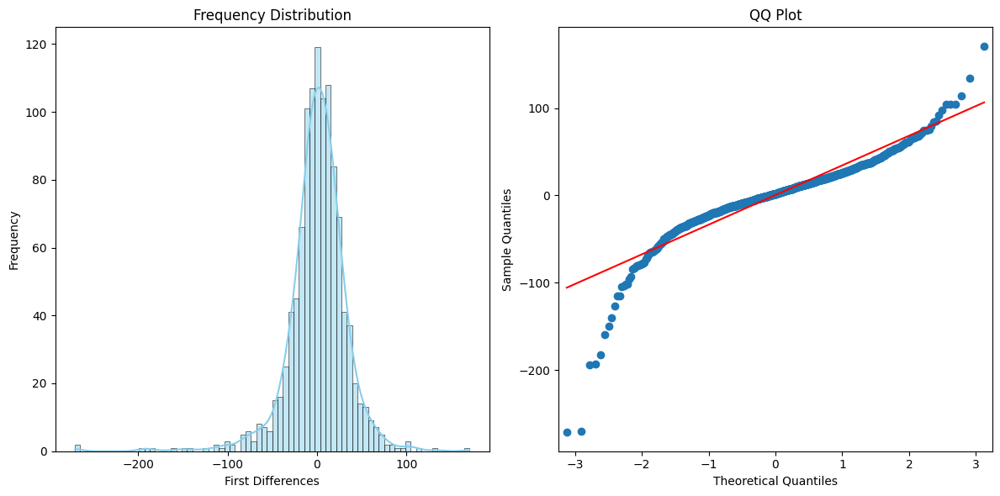

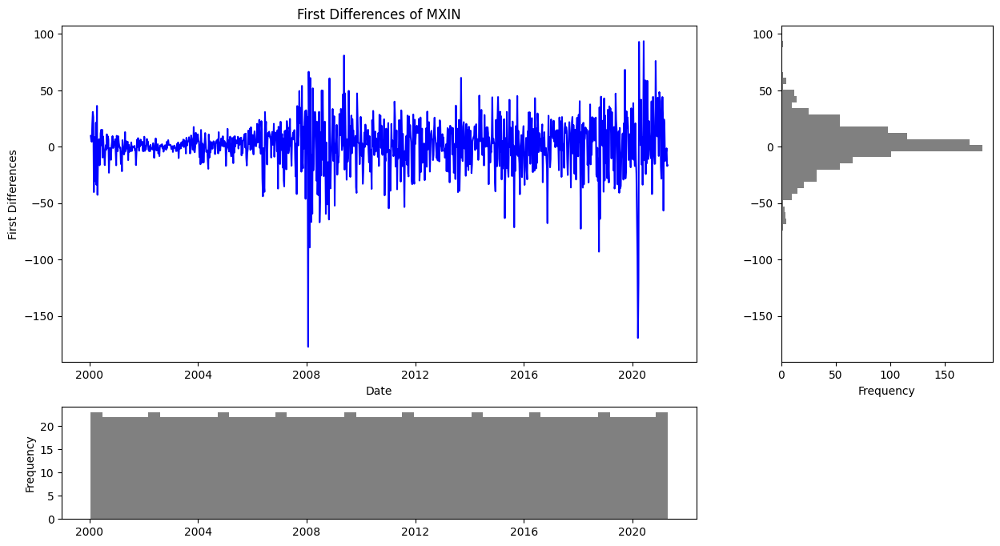

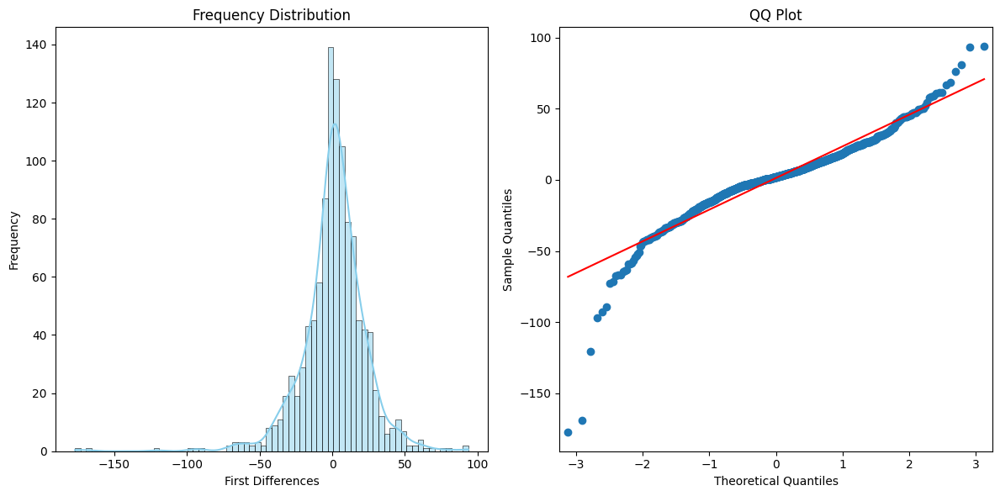

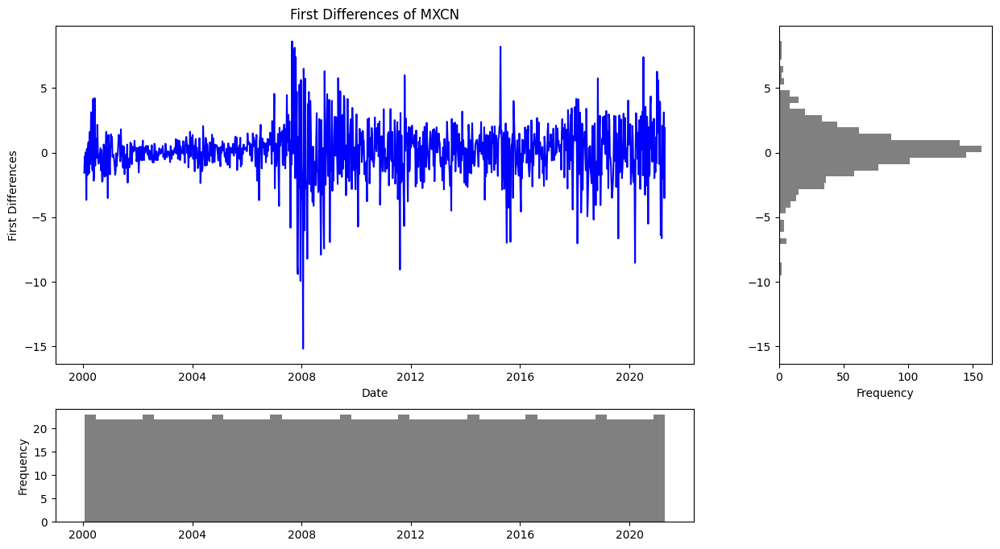

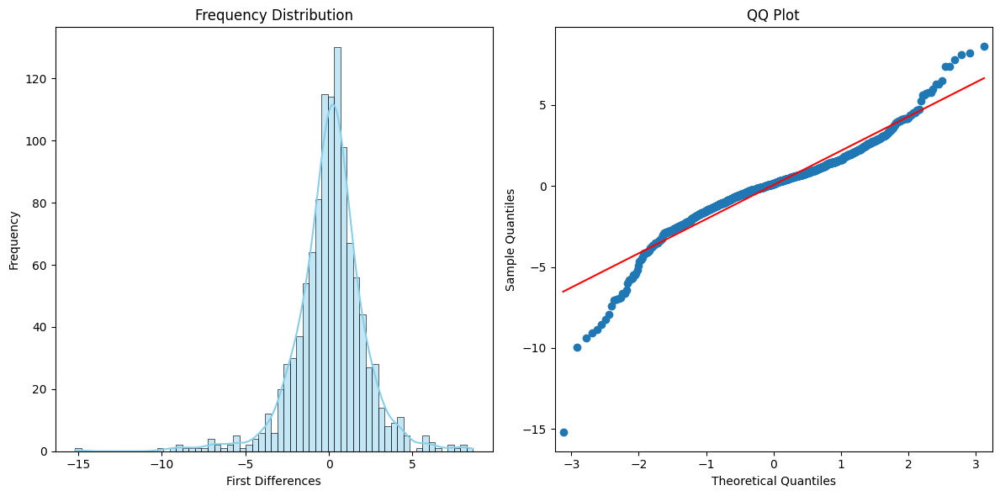

In [ ]:
import scipy.stats as stats
import seaborn as sns
import matplotlib.gridspec as gridspec
import statsmodels.api as sm

# Iterate over each column (excluding 'Data')
for col in df.columns[1:]:
    # Compute first differences
    first_diff = df[col].diff().dropna()

    # Plotting
    fig = plt.figure(figsize=(15, 8))
    gs = gridspec.GridSpec(2, 2, width_ratios=[3, 1], height_ratios=[3, 1])
    ax_main = plt.subplot(gs[0, 0])
    ax_histx = plt.subplot(gs[1, 0], sharex=ax_main)
    ax_histy = plt.subplot(gs[0, 1], sharey=ax_main)

    # Scatterplot on main ax
    ax_main.plot(df.index[1:], first_diff, linestyle='-', color='blue')

    # Hist on the attached axes
    ax_histx.hist(df.index[1:], bins=50, orientation='vertical', color='gray')
    ax_histy.hist(first_diff, bins=50, orientation='horizontal', color='gray')

    # Settings
    ax_main.set(title=f'First Differences of {col}', xlabel='Date', ylabel='First Differences')
    ax_histx.set(ylabel='Frequency')
    ax_histy.set(xlabel='Frequency')

    # Check Gaussianity and QQ plot
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    # Plot frequency distribution
    sns.histplot(first_diff, kde=True, ax=ax[0], color='skyblue')
    ax[0].set_title('Frequency Distribution')
    ax[0].set_xlabel('First Differences')
    ax[0].set_ylabel('Frequency')

    # Check Gaussianity
    sm.qqplot(first_diff, line='s', ax=ax[1])
    ax[1].set_title('QQ Plot')
    ax[1].set_xlabel('Theoretical Quantiles')
    ax[1].set_ylabel('Sample Quantiles')
    plt.tight_layout()
    plt.show()


In [ ]:
'''
import seaborn as sns

# Drop the 'Y' column temporarily for pairplot
df_diff_temp = df_diff.drop(columns=['Y'])

# Create pairplots
sns.pairplot(df_diff_temp)
plt.show()
'''

"\nimport seaborn as sns\n\n# Drop the 'Y' column temporarily for pairplot\ndf_diff_temp = df_diff.drop(columns=['Y'])\n\n# Create pairplots\nsns.pairplot(df_diff_temp)\nplt.show()\n"

## Train Test split

In [ ]:
from sklearn.model_selection import train_test_split

# Separate examples with Y=0 and Y=1
df_diff_Y0 = df_diff[df_diff['Y'] == 0]
df_diff_Y1 = df_diff[df_diff['Y'] == 1]

# Divide the examples with Y=0 into training, cross-validation, and test sets
df_train_Y0, df_temp_Y0 = train_test_split(df_diff_Y0, test_size=0.2, random_state=42)
df_cv_Y0, df_test_Y0 = train_test_split(df_temp_Y0, test_size=0.5, random_state=42)

# Divide the examples with Y=1 into cross-validation and test sets
df_cv_Y1, df_test_Y1 = train_test_split(df_diff_Y1, test_size=0.5, random_state=42)

# Concatenate the sets
df_train = pd.concat([df_train_Y0])
df_cv = pd.concat([df_cv_Y0, df_cv_Y1])
df_test = pd.concat([df_test_Y0, df_test_Y1])

# Shuffle the datasets
df_train = df_train.sample(frac=1, random_state=42).reset_index(drop=True)
df_cv = df_cv.sample(frac=1, random_state=42).reset_index(drop=True)
df_test = df_test.sample(frac=1, random_state=42).reset_index(drop=True)

# Display the shape of each set
print("Training set shape:", df_train.shape)
print("Cross-validation set shape:", df_cv.shape)
print("Test set shape:", df_test.shape)

Training set shape: (389, 43)
Cross-validation set shape: (107, 43)
Test set shape: (107, 43)


In [ ]:
X_train = df_train.drop(columns=['Y']).values
X_cv = df_cv.drop(columns=['Y']).values
X_test = df_test.drop(columns=['Y']).values

In [ ]:
y_train = df_train['Y'].values
y_cv = df_cv['Y'].values
y_test = df_test['Y'].values

## Multivariate Gaussian technique (improve this)

In [ ]:
# Calculate the covariance matrix and mean vector for the training set
sigma = df_train.drop(columns=['Y']).cov()
sigma = 0.5 * (sigma + sigma.T)  # Ensure symmetry
mu = df_train.drop(columns=['Y']).mean()

# Display the covariance matrix and mean vector
print("Covariance Matrix:")
print(sigma)
print("\nMean Vector:")
print(mu)


Covariance Matrix:
           ECSURPUS      XAU BGNL      BDIY       CRY       Cl1           DXY  \
ECSURPUS   2.559871  7.996485e-04  0.005605  0.001493  0.003486 -1.752683e-03   
XAU BGNL   0.000800  5.026360e-04  0.000067  0.000176  0.000196 -1.180879e-04   
BDIY       0.005605  6.678366e-05  0.007548  0.000286  0.000796 -8.501536e-05   
CRY        0.001493  1.757445e-04  0.000286  0.000446  0.000815 -7.992572e-05   
Cl1        0.003486  1.964297e-04  0.000796  0.000815  0.002059 -1.085736e-04   
DXY       -0.001753 -1.180879e-04 -0.000085 -0.000080 -0.000109  1.061600e-04   
EMUSTRUU  -0.001018  3.532741e-05  0.000065  0.000036  0.000073 -1.625583e-05   
GBP        0.000682  1.186655e-04  0.000087  0.000085  0.000111 -9.602139e-05   
JPY       -0.001906 -9.780320e-05 -0.000003 -0.000018  0.000006  6.856208e-05   
LF94TRUU   0.000913  8.408441e-05  0.000069  0.000054  0.000087 -5.537736e-05   
LF98TRUU  -0.000246  1.855381e-05  0.000038  0.000047  0.000083 -1.233142e-05   
LG30TRUU 

In [ ]:
from scipy.stats import multivariate_normal
from sklearn.metrics import f1_score

def find_best_epsilon(y_cv, p):
    best_epsilon = 0
    best_f1 = 0

    for epsilon in np.linspace(min(p), max(p), num=1000):
        preds = (p < epsilon).astype(int)
        f1 = f1_score(y_cv, preds)

        if f1 > best_f1:
            best_f1 = f1
            best_epsilon = epsilon

    return best_epsilon, best_f1

# Compute the probability density function for each example in XCV for the cross-validation set
p_cv = multivariate_normal.pdf(df_cv.drop(columns=['Y']), mean=mu, cov=sigma)

# Find the optimal epsilon for the cross-validation set
best_epsilon_cv, best_f1_cv = find_best_epsilon(df_cv['Y'], p_cv)

print("Best Epsilon for Cross-validation set:", best_epsilon_cv)
print("Best F1 Score for Cross-validation set:", best_f1_cv)

# Compute the probability density function for each example in XTest for the test set
p_test = multivariate_normal.pdf(df_test.drop(columns=['Y']), mean=mu, cov=sigma)

# Find the optimal epsilon for the test set
best_epsilon_test, best_f1_test = find_best_epsilon(df_test['Y'], p_test)

print("\nBest Epsilon for Test set:", best_epsilon_test)
print("Best F1 Score for Test set:", best_f1_test)


Best Epsilon for Cross-validation set: 1.6985550058251725e+47
Best F1 Score for Cross-validation set: 0.7354838709677419

Best Epsilon for Test set: 8.302608949954586e+48
Best F1 Score for Test set: 0.7073170731707317


In [ ]:
# Compute the probability density function for each example in XTest for the test set
p_test = multivariate_normal.pdf(df_test.drop(columns=['Y']), mean=mu, cov=sigma)

# Predict anomalies based on the optimal epsilon
predictions = p_test < best_epsilon_test

# Compute True Positives, False Positives, False Negatives
tp = sum((predictions == 1) & (df_test['Y'] == 1))
fp = sum((predictions == 1) & (df_test['Y'] == 0))
fn = sum((predictions == 0) & (df_test['Y'] == 1))

# Compute Precision, Recall, and F1 Score
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1_score = 2 * precision * recall / (precision + recall)

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1_score)

Precision: 0.5471698113207547
Recall: 1.0
F1 Score: 0.7073170731707317


## Isolation Forest

### Algorithm

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix

In [ ]:
# Function to evaluate the performance of the outlier detection algorithm
def evaluate_performance(y_true, y_pred, y_scores):
    # Area Under the ROC Curve (AUC-ROC)
    auc_roc = roc_auc_score(y_true, y_scores)

    # Precision, Recall, and F1-score
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_true, y_pred)

    # Plot Confusion Matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title("Confusion Matrix")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

    # Print the evaluation metrics
    print("Area Under ROC Curve (AUC-ROC):", auc_roc)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)


In [ ]:
from sklearn.ensemble import IsolationForest

rng = np.random.RandomState(42)
# Fit the Isolation Forest
clf = IsolationForest(max_samples=200, contamination='auto', random_state=rng)
clf.fit(X_train)

# Predictions
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

y_pred_train = np.where(np.array(y_pred_train) == 1, 0, 1)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)

anomaly_scores_train = clf.decision_function(X_train)
anomaly_scores_test = clf.decision_function(X_test)

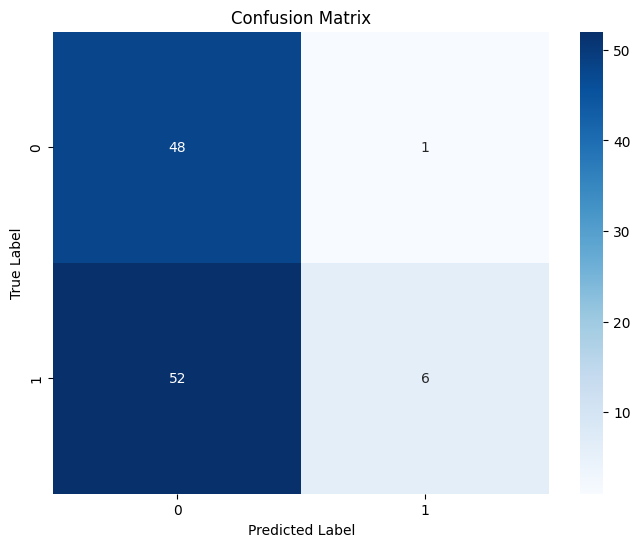

Area Under ROC Curve (AUC-ROC): 0.3610133708655876
Precision: 0.8571428571428571
Recall: 0.10344827586206896
F1-score: 0.1846153846153846


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

### optimizing F1 score

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.metrics import f1_score

# Define lists of hyperparameters to try
n_estimators_values = [100, 200, 300]
max_samples_values = [100, 200, 300]
contamination_values = [0.05, 0.1, 0.2]

best_f1_score = -1
best_hyperparameters = {}

# Iterate over all combinations of hyperparameters
for n_estimators in n_estimators_values:
    for max_samples in max_samples_values:
        for contamination in contamination_values:
            # Create an instance of Isolation Forest with the current hyperparameters
            clf = IsolationForest(n_estimators=n_estimators, max_samples=max_samples, contamination=contamination, random_state=42)

            # Fit the model and make predictions
            clf.fit(X_train)
            y_pred = clf.predict(X_cv)

            y_pred = np.where(np.array(y_pred) == 1, 0, 1)

            # Evaluate F1-score
            f1 = f1_score(y_cv, y_pred)

            # Check if this combination of hyperparameters resulted in a better F1-score
            if f1 > best_f1_score:
                best_f1_score = f1
                best_hyperparameters = {'n_estimators': n_estimators, 'max_samples': max_samples, 'contamination': contamination}

# Print the best hyperparameters found
print("Best hyperparameters:", best_hyperparameters)
print("Best F1-score:", best_f1_score)

Best hyperparameters: {'n_estimators': 300, 'max_samples': 300, 'contamination': 0.2}
Best F1-score: 0.6530612244897959


In [ ]:
clf = IsolationForest(n_estimators=best_hyperparameters['n_estimators'],
                      max_samples=best_hyperparameters['max_samples'],
                      contamination=best_hyperparameters['contamination'],
                      random_state=rng)
clf.fit(X_train)

# Predictions
y_pred_test = clf.predict(X_test)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)
anomaly_scores_test = clf.decision_function(X_test)

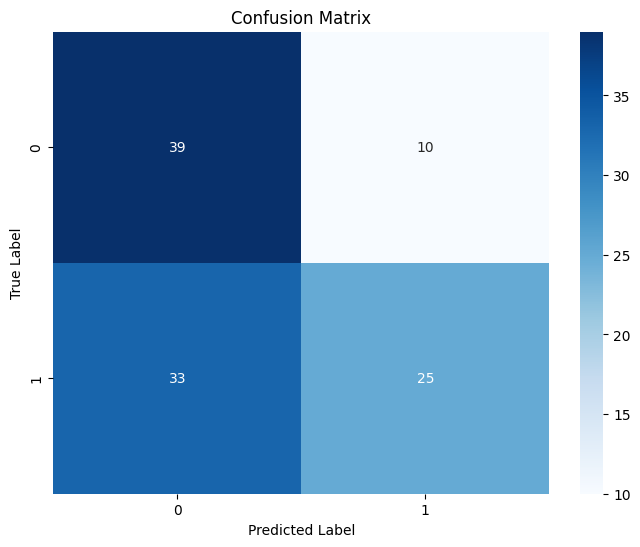

Area Under ROC Curve (AUC-ROC): 0.35186488388458836
Precision: 0.7142857142857143
Recall: 0.43103448275862066
F1-score: 0.5376344086021506


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

### optimizing AUC-ROC

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.metrics import roc_auc_score

# Define lists of hyperparameters to try
n_estimators_values = [100, 200, 300]
max_samples_values = [100, 200, 300]
contamination_values = [0.05, 0.1, 0.2]

best_auc_roc_score = -1
best_hyperparameters = {}

# Iterate over all combinations of hyperparameters
for n_estimators in n_estimators_values:
    for max_samples in max_samples_values:
        for contamination in contamination_values:
            # Create an instance of Isolation Forest with the current hyperparameters
            clf = IsolationForest(n_estimators=n_estimators, max_samples=max_samples, contamination=contamination, random_state=42)

            # Fit the model and make predictions
            clf.fit(X_train)
            y_scores = clf.decision_function(X_cv)

            # Compute AUC-ROC score
            auc_roc = roc_auc_score(y_cv, y_scores)

            # Check if this combination of hyperparameters resulted in a better AUC-ROC score
            if auc_roc > best_auc_roc_score:
                best_auc_roc_score = auc_roc
                best_hyperparameters = {'n_estimators': n_estimators, 'max_samples': max_samples, 'contamination': contamination}

# Print the best hyperparameters found
print("Best hyperparameters:", best_hyperparameters)
print("Best AUC-ROC score:", best_auc_roc_score)


Best hyperparameters: {'n_estimators': 100, 'max_samples': 100, 'contamination': 0.05}
Best AUC-ROC score: 0.2674173117522871


In [ ]:
clf = IsolationForest(n_estimators=best_hyperparameters['n_estimators'],
                      max_samples=best_hyperparameters['max_samples'],
                      contamination=best_hyperparameters['contamination'],
                      random_state=rng)
clf.fit(X_train)

# Predictions
y_pred_test = clf.predict(X_test)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)
anomaly_scores_test = clf.decision_function(X_test)

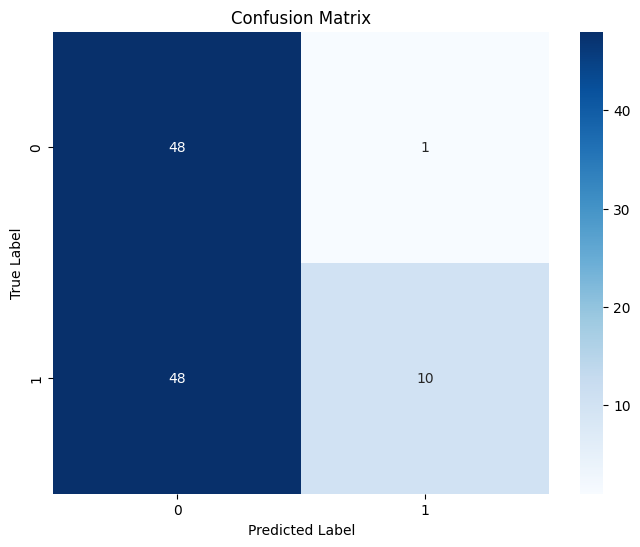

Area Under ROC Curve (AUC-ROC): 0.3754398311048557
Precision: 0.9090909090909091
Recall: 0.1724137931034483
F1-score: 0.2898550724637681


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

## One class SVM

### Algorithm

In [ ]:
from sklearn import svm

# Fit the model
clf = svm.OneClassSVM(nu=0.1, kernel="rbf", gamma=0.1)
clf.fit(X_train)

# Predictions
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

y_pred_train = np.where(np.array(y_pred_train) == 1, 0, 1)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)

anomaly_scores_train = clf.decision_function(X_train)
anomaly_scores_test = clf.decision_function(X_test)

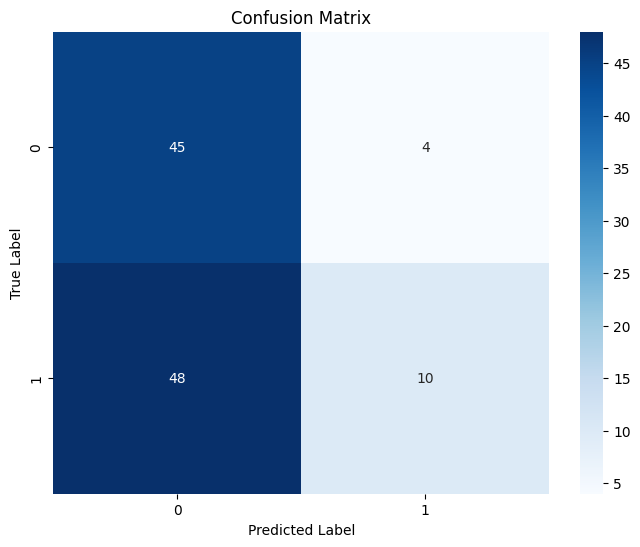

Area Under ROC Curve (AUC-ROC): 0.3465869106263195
Precision: 0.7142857142857143
Recall: 0.1724137931034483
F1-score: 0.2777777777777778


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

### optimizing F1 score

In [ ]:
from sklearn.svm import OneClassSVM
from sklearn.metrics import f1_score

# Define lists of hyperparameters to try
nu_values = [0.01, 0.1, 0.2]
gamma_values = [0.1, 0.01, 0.001]

best_f1_score = -1
best_hyperparameters = {}

# Iterate over all combinations of hyperparameters
for nu in nu_values:
    for gamma in gamma_values:
        # Create an instance of One-Class SVM with the current hyperparameters
        clf = OneClassSVM(nu=nu, kernel="rbf", gamma=gamma)

        # Fit the model and make predictions
        clf.fit(X_train)
        y_pred = clf.predict(X_cv)
        y_pred = np.where(np.array(y_pred) == 1, 0, 1)

        # Evaluate F1-score
        f1 = f1_score(y_test, y_pred)

        # Check if this combination of hyperparameters resulted in a better F1-score
        if f1 > best_f1_score:
            best_f1_score = f1
            best_hyperparameters = {'nu': nu, 'gamma': gamma}

# Print the best hyperparameters found
print("Best hyperparameters:", best_hyperparameters)
print("Best F1-score:", best_f1_score)


Best hyperparameters: {'nu': 0.2, 'gamma': 0.1}
Best F1-score: 0.4102564102564103


In [ ]:
clf = OneClassSVM(nu=best_hyperparameters['nu'],
                      kernel='rbf',
                      gamma=best_hyperparameters['gamma'])
clf.fit(X_train)

# Predictions
y_pred_test = clf.predict(X_test)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)
anomaly_scores_test = clf.decision_function(X_test)

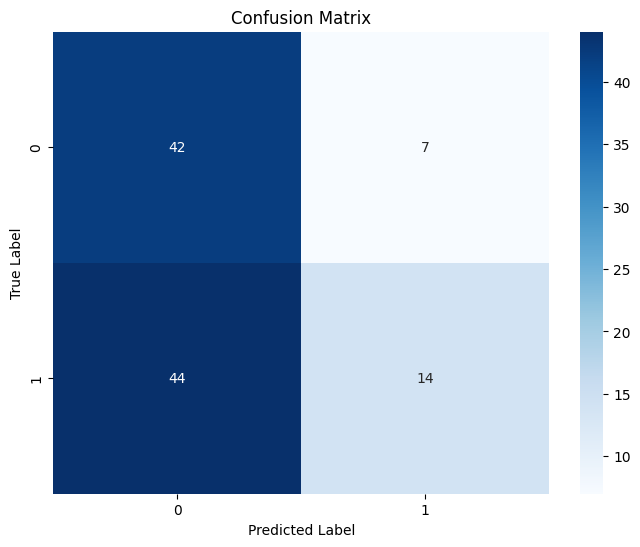

Area Under ROC Curve (AUC-ROC): 0.36664320900774106
Precision: 0.6666666666666666
Recall: 0.2413793103448276
F1-score: 0.35443037974683544


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

### optimizing AUC-ROC

In [ ]:
from sklearn.svm import OneClassSVM
from sklearn.metrics import roc_auc_score

# Define lists of hyperparameters to try
nu_values = [0.01, 0.1, 0.2]
gamma_values = [0.1, 0.01, 0.001]

best_auc_roc_score = -1
best_hyperparameters = {}

# Iterate over all combinations of hyperparameters
for nu in nu_values:
    for gamma in gamma_values:
        # Create an instance of One-Class SVM with the current hyperparameters
        clf = OneClassSVM(nu=nu, kernel="rbf", gamma=gamma)

        # Fit the model and make predictions
        clf.fit(X_train)
        y_scores = clf.decision_function(X_cv)

        # Compute AUC-ROC score
        auc_roc = roc_auc_score(y_cv, y_scores)

        # Check if this combination of hyperparameters resulted in a better AUC-ROC score
        if auc_roc > best_auc_roc_score:
            best_auc_roc_score = auc_roc
            best_hyperparameters = {'nu': nu, 'gamma': gamma}

# Print the best hyperparameters found
print("Best hyperparameters:", best_hyperparameters)
print("Best AUC-ROC score:", best_auc_roc_score)


Best hyperparameters: {'nu': 0.01, 'gamma': 0.001}
Best AUC-ROC score: 0.43209007741027444


In [ ]:
clf = OneClassSVM(nu=best_hyperparameters['nu'],
                      kernel='rbf',
                      gamma=best_hyperparameters['gamma'])
clf.fit(X_train)

# Predictions
y_pred_test = clf.predict(X_test)
y_pred_test = np.where(np.array(y_pred_test) == 1, 0, 1)
anomaly_scores_test = clf.decision_function(X_test)

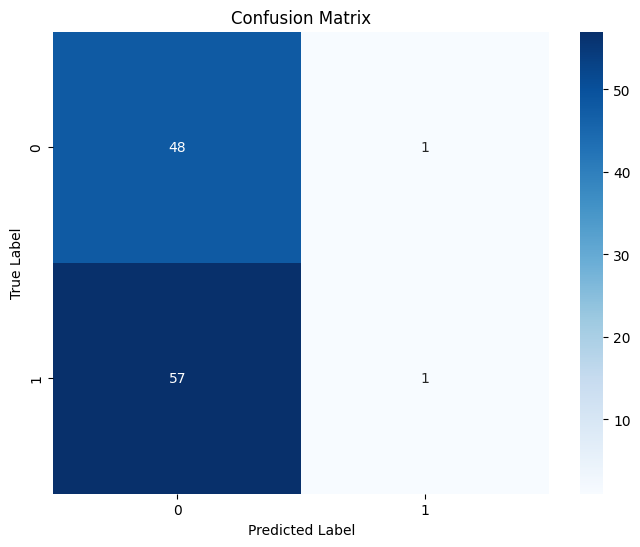

Area Under ROC Curve (AUC-ROC): 0.49437016185784655
Precision: 0.5
Recall: 0.017241379310344827
F1-score: 0.03333333333333333


In [ ]:
evaluate_performance(y_test, y_pred_test, anomaly_scores_test)

## Autoencoder

In [ ]:
from sklearn.model_selection import train_test_split
from keras.layers import Input, Dense
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
import pandas as pd
import numpy as np

# Shuffle the datasets
df_train = df_train.sample(frac=1, random_state=42).reset_index(drop=True)
df_cv = df_cv.sample(frac=1, random_state=42).reset_index(drop=True)
df_test = df_test.sample(frac=1, random_state=42).reset_index(drop=True)

# Display the shape of each set
print("Training set shape:", df_train.shape)
print("Cross-validation set shape:", df_cv.shape)
print("Test set shape:", df_test.shape)

# Define the autoencoder model
input_dim = df_train.shape[1] - 1  # Excluding the target variable 'Y'
encoding_dim = 10
hidden_dim = 20

input_layer = Input(shape=(input_dim,))
hidden_layer_1 = Dense(hidden_dim, activation='relu')(input_layer)
encoded_layer = Dense(encoding_dim, activation='relu')(hidden_layer_1)
hidden_layer_2 = Dense(hidden_dim, activation='relu')(encoded_layer)
output_layer = Dense(input_dim)(hidden_layer_2)

model = Model(input_layer, output_layer)

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Divide the dataframes into features (X) and target (Y)
X_train = df_train.drop(columns=['Y']).values
X_cv = df_cv.drop(columns=['Y']).values
X_test = df_test.drop(columns=['Y']).values

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=50, verbose=1)

# Train the model
history = model.fit(X_train, X_train, epochs=2000, batch_size=16, validation_data=(X_cv, X_cv), callbacks=[early_stopping])

Training set shape: (389, 43)
Cross-validation set shape: (107, 43)
Test set shape: (107, 43)
Epoch 1/2000
25/25 [==============================] - 1s 11ms/step - loss: 0.1310 - val_loss: 0.0849
Epoch 2/2000
25/25 [==============================] - 0s 3ms/step - loss: 0.1106 - val_loss: 0.0681
Epoch 3/2000
25/25 [==============================] - 0s 4ms/step - loss: 0.0814 - val_loss: 0.0408
Epoch 4/2000
25/25 [==============================] - 0s 3ms/step - loss: 0.0414 - val_loss: 0.0187
Epoch 5/2000
25/25 [==============================] - 0s 3ms/step - loss: 0.0196 - val_loss: 0.0159
Epoch 6/2000
25/25 [==============================] - 0s 3ms/step - loss: 0.0135 - val_loss: 0.0117
Epoch 7/2000
25/25 [==============================] - 0s 4ms/step - loss: 0.0090 - val_loss: 0.0093
Epoch 8/2000
25/25 [==============================] - 0s 3ms/step - loss: 0.0061 - val_loss: 0.0083
Epoch 9/2000
25/25 [==============================] - 0s 4ms/step - loss: 0.0051 - val_loss: 0.0079
Epoch

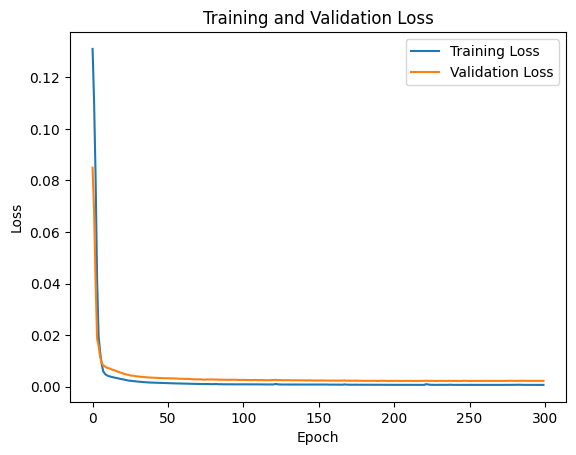

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
threshold = 0.5
# Evaluate the model on the test set
reconstruction_errors_test = np.mean(np.power(X_test - model.predict(X_test), 2), axis=1)

# Detect anomalies and normal samples based on the threshold
anomalies_test = np.where(reconstruction_errors_test > threshold)[0]
normal_test = np.where(reconstruction_errors_test <= threshold)[0]

# Print the number of anomalies and normal samples detected in the test set
print(f"{len(anomalies_test)} anomalies and {len(normal_test)} normal samples detected in the test set.")

4/4 [==============================] - 0s 3ms/step
0 anomalies and 107 normal samples detected in the test set.


4/4 [==============================] - 0s 2ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


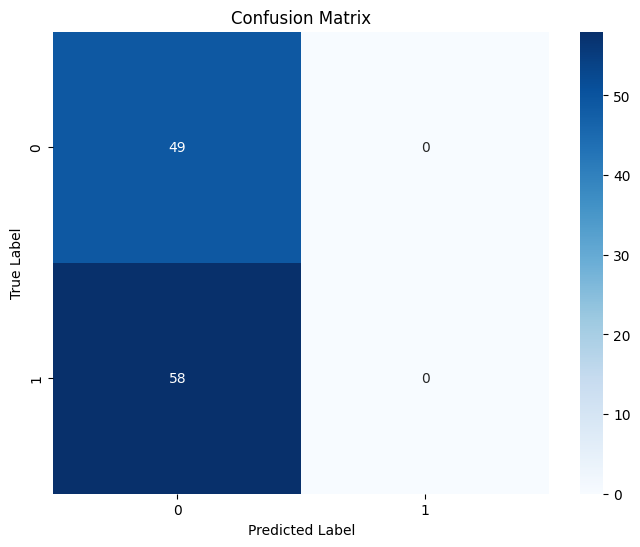

Area Under ROC Curve (AUC-ROC): 0.5144264602392682
Precision: 0.0
Recall: 0.0
F1-score: 0.0


In [ ]:
# Assuming X_test is the test data

# Calculate the reconstruction errors for the test set
reconstruction_errors_test = np.mean(np.power(X_test - model.predict(X_test), 2), axis=1)

# Define a threshold for determining anomalies
# You might set this threshold based on the distribution of reconstruction errors
#threshold = 0.5  # Example threshold value

# Determine anomalies and normal samples based on the threshold
y_true_test = y_test  # Placeholder labels, assuming all samples are normal
y_pred_test = np.where(reconstruction_errors_test > threshold, 1, 0)
y_scores_test = reconstruction_errors_test

# Pass these to the evaluate_performance function
evaluate_performance(y_true_test, y_pred_test, y_scores_test)


## Pycaret

### Import

In [ ]:
import sys

!{sys.executable} -m pip install pycaret --quiet
!{sys.executable} -m pip install scipy==1.11.4 --quiet
!{sys.executable} -m pip install umap-learn --quiet

In [ ]:
# restart kernel if broken
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from pycaret.anomaly import *

ImportError: cannot import name '_Scorer' from 'sklearn.metrics._scorer' (/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py)

### Config

In [ ]:
path = "https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data"
column_names = df.columns
na_value=' ?'
columns_to_drop = []
threshold_missing = 0.8 # columns with more than x missing values are dropped
fill_numeric_method = 'median' # mean, median, zero. How to fill missing numeric values
fill_categorical_method = 'constant' # constant, mode. How to fill missing categorical values
rare_category_threshold = 0.5 # categories with less then x occourrences are mapped into 'other'
Standardization = False
model_names = ['iforest','cluster', 'histogram', 'iforest', 'lof', 'mcd']
anomaly_ratio = 237/1111 # Ratio of anomalies in the dataset
min_num_models = 1 # Filter anomalies reported by at least x models
print_anomalies = True # UMAP plot. It's slow

### Exploration

In [ ]:
data = df

#### Dimension

In [ ]:
total_rows = data.shape[0]
total_columns = data.shape[1]
print(f'Rows: {total_rows}\nColumns: {total_columns}')

#### Types

In [ ]:
pd.DataFrame(data.dtypes, columns=['type'])

#### Missing

In [ ]:
missing_df = pd.DataFrame(data.isnull().sum(), columns=['missing_num'])
missing_df['missing_ratio'] = (missing_df['missing_num']/total_rows).round(2)
missing_df

#### Distributions

In [ ]:
data.describe(include='all')

### Handle missing values

In [ ]:
# Drop columns with more than threshold missing values

threshold = threshold_missing * len(data)
data.dropna(thresh=threshold, axis=1, inplace=True)

In [ ]:
# Fill missing values for numeric features
numeric_columns = data.select_dtypes(include=['int64', 'float64']).columns
for col in numeric_columns:
    if fill_numeric_method=='median':
        value_to_fill = data[col].median()
    elif fill_numeric_method=='mean':
        value_to_fill = data[col].mean()
    elif fill_numeric_method=='zero':
        value_to_fill = 0
    data[col].fillna(value_to_fill, inplace=True)

In [ ]:
# Fill missing values for categorical features
categorical_columns = data.select_dtypes(include=['object']).columns
for col in categorical_columns:
    if fill_categorical_method=='constant':
        value_to_fill = 'missing'
    elif fill_categorical_method=='mode':
        value_to_fill = df[col].mode()[0]
    data[col].fillna(value_to_fill, inplace=True)

### Preprocessing

In [ ]:
# Impute rare categories
for col in categorical_columns:
    value_counts = data[col].value_counts(normalize=True)
    data[col] = data[col].apply(lambda x: 'other' if value_counts[x] < (rare_category_threshold * total_rows) else x)

In [ ]:
# Drop categorical columns with one category
for col in categorical_columns:
    if len(data[col].unique()) == 1:
        data.drop(col, axis=1, inplace=True)

In [ ]:
# OneHotEncoding
categorical_cols = data.select_dtypes(include=['object']).columns
for col in categorical_cols:
    data[col] = pd.Categorical(data[col])
data = pd.get_dummies(data, columns=categorical_cols, drop_first=True)

In [ ]:
# Standardization
if Standardization:
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    scaler = StandardScaler()
    data[numeric_cols] = scaler.fit_transform(data[numeric_cols])

### Anomaly detection

In [ ]:
# Initialize anomaly detection setup
setup(data, verbose=False, session_id=42, index=False)

# Build models
models = {model_name: create_model(model_name, fraction=anomaly_ratio) for model_name in model_names}

# Make predictions
predictions = {model_name: predict_model(models[model_name], data=data) for model_name, model in models.items()}

# Assign labels to data
for model_name, prediction in predictions.items():
    # add labels to data
    data[f'anomaly_score_{model_name}'] = prediction['Anomaly_Score']
    data[f'anomaly_taget_{model_name}'] = prediction['Anomaly']

# Number of algorithms which reported a row as anomaly
data['num_anomalies'] = data.filter(regex='^anomaly_taget_').sum(axis=1)

#### Filter anomalies

In [ ]:
data_anomalies = data[data['num_anomalies']>=min_num_models]
data_anomalies

#### evaluate performance

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_iforest'], data_anomalies['anomaly_score_iforest'])

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_cluster'], data_anomalies['anomaly_score_cluster'])

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_histogram'], data_anomalies['anomaly_score_histogram'])

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_lof'], data_anomalies['anomaly_score_lof'])

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_mcd'], data_anomalies['anomaly_score_mcd'])

#### UMAP Plot

In [ ]:
for model_name, model in models.items():
    print(f'{model_name}:\n')
    plot_model(model,plot='umap')
    print('\n\n')

In [ ]:
!pip install numpy pandas matplotlib scikit-learn pyod

In [ ]:
#KERNEL PCA (KPCA)

from pyod.models.kpca import KPCA
from pyod.utils.data import evaluate_print, generate_data
from pyod.utils.example import visualize

# temporary solution for relative imports in case pyod is not installed
# if pyod is installed, no need to use the following line
sys.path.append(os.path.abspath(os.path.join(os.path.dirname("__file__"), "..")))


if __name__ == "__main__":
    contamination = 0.1  # percentage of outliers
    n_train = 200  # number of training points
    n_test = 100  # number of testing points
    n_features = 2

    # Generate sample data
    X_train, X_test, y_train, y_test = generate_data(
        n_train=n_train,
        n_test=n_test,
        n_features=2,
        contamination=contamination,
        random_state=42,
        behaviour="new",
    )

    # train KPCA detector
    clf_name = "KPCA"
    clf = KPCA()
    clf.fit(X_train)

    # get the prediction labels and outlier scores of the training data
    y_train_pred = clf.labels_  # binary labels (0: inliers, 1: outliers)
    y_train_scores = clf.decision_scores_  # raw outlier scores

    # get the prediction on the test data
    y_test_pred = clf.predict(X_test)  # outlier labels (0 or 1)
    y_test_scores = clf.decision_function(X_test)  # outlier scores

    # evaluate and print the results
    print("\nOn Training Data:")
    evaluate_print(clf_name, y_train, y_train_scores)
    print("\nOn Test Data:")
    evaluate_print(clf_name, y_test, y_test_scores)

    # visualize the results
    visualize(
        clf_name,
        X_train,
        y_train,
        X_test,
        y_test,
        y_train_pred,
        y_test_pred,
        show_figure=True,
    )

In [ ]:
from pyod.models.copod import COPOD
from pyod.utils.data import evaluate_print

# Initialize COPOD model
model = COPOD()

# Fit the model
model.fit(X_train)

# Predict the anomaly scores for the cross-validation data
y_pred_cv = model.predict(X_cv)

# Evaluate the model on the cross-validation data
evaluate_print('COPOD', y_cv, y_pred_cv)

# Predict the anomaly scores for the test data
y_pred_test = model.predict(X_test)

# Evaluate the model on the test data
evaluate_print('COPOD', y_test, y_pred_test)

TypeError: validate_params() got an unexpected keyword argument 'prefer_skip_nested_validation'

In [ ]:
#DeepSVDD.
from pyod.models.deep_svdd import DeepSVDD

use_ae = True
contamination = 0.1
random_state = 42

# train DeepSVDD detector (Without-AE)
clf_name = 'DeepSVDD'
clf = DeepSVDD(use_ae=use_ae, epochs=10, contamination=contamination, random_state=random_state)
clf.fit(X_train)

# get the prediction labels and outlier scores of the training data
y_train_scores = clf.decision_scores_  # raw outlier scores

# get the prediction on the cross-validation data
y_cv_scores = clf.decision_function(X_cv)  # outlier scores

# get the prediction on the test data
y_test_scores = clf.decision_function(X_test)  # outlier scores

# evaluate and print the results
print("\nOn Cross-validation Data:")
evaluate_print(clf_name, y_cv, y_cv_scores)
print("\nOn Test Data:")
evaluate_print(clf_name, y_test, y_test_scores)

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot for visualization
plt.figure(figsize=(10, 6))

# Plotting cross-validation data
plt.scatter(range(len(y_cv_scores)), y_cv_scores, color='blue', label='Cross-validation')

# Plotting test data
plt.scatter(range(len(y_cv_scores), len(y_cv_scores) + len(y_test_scores)), y_test_scores, color='red', label='Test')

plt.title('Outlier Scores')
plt.xlabel('Index')
plt.ylabel('Outlier Score')
plt.legend()
plt.show()


In [ ]:
#KPCA


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report

preprocessor = StandardScaler()

# Fit and transform preprocessing on training data
X_train_scaled = preprocessor.fit_transform(X_train)

# Define COPOD model
copod = COPOD()

# Define parameter grid for grid search
param_grid = {
    'contamination': [0.05, 0.1, 0.15],
}

# Grid search with cross-validation
grid_search = GridSearchCV(copod, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train_scaled, y_train)

# Get best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Fit COPOD model with best parameters
best_copod = COPOD(**best_params)
best_copod.fit(X_train_scaled)

# Transform cross-validation and test data using the same scaler
X_cv_scaled = preprocessor.transform(X_cv)
X_test_scaled = preprocessor.transform(X_test)

# Predict on cross-validation and test sets
y_pred_cv = best_copod.predict(X_cv_scaled)
y_pred_test = best_copod.predict(X_test_scaled)

# Evaluate the model
print("Evaluation on Cross-Validation Set:")
print(classification_report(y_cv, y_pred_cv))
print("Evaluation on Test Set:")
print(classification_report(y_test, y_pred_test))

In [ ]:
#%%
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from pyod.models.copod import COPOD
from sklearn.metrics import classification_report

# Assuming you already have df_diff_Y0, df_diff_Y1, df_train, df_cv, and df_test from your provided code

# Define a preprocessing pipeline with feature scaling
preprocessor = StandardScaler()

# Fit and transform preprocessing on training data
X_train_scaled = preprocessor.fit_transform(X_train)

# Define COPOD model
copod = COPOD()

# Define parameter grid for grid search
param_grid = {
    'contamination': [0.05, 0.1, 0.15]
}

# Grid search with cross-validation
grid_search = GridSearchCV(copod, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled)

# Get best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Fit COPOD model with best parameters
best_copod = COPOD(**best_params)
best_copod.fit(X_train_scaled)

# Transform cross-validation and test data using the same scaler
X_cv_scaled = preprocessor.transform(X_cv)
X_test_scaled = preprocessor.transform(X_test)

# Predict on cross-validation and test sets
y_pred_cv = best_copod.predict(X_cv_scaled)
y_pred_test = best_copod.predict(X_test_scaled)

# Evaluate the model
print("Evaluation on Cross-Validation Set:")
print(classification_report(y_cv, y_pred_cv))
print("Evaluation on Test Set:")
print(classification_report(y_test, y_pred_test))

## Deep Learning Classifier

In [ ]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [ ]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)
# Import other libraries
import cv2
from tensorflow.keras.applications.mobilenet import preprocess_input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
import seaborn as sns
import pandas as pd

In [ ]:
from keras.layers import Input, Dense
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, accuracy_score

In [ ]:
# new train test split
from sklearn.model_selection import train_test_split

X = df_diff.drop(columns=['Y']).values
y = df_diff['Y'].values

# Divide the examples into training, cross-validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_cv, X_test, y_cv, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# Display the shape of each set
print("Training set shape:", X_train.shape)
print("Cross-validation set shape:", X_cv.shape)
print("Test set shape:", X_test.shape)

print("Training set shape:", y_train.shape)
print("Cross-validation set shape:", y_cv.shape)
print("Test set shape:", y_test.shape)

In [ ]:
# Define the classifier model
input_dim = X_train.shape[1]
output_dim = 1

input_layer = Input(shape=(input_dim,))
#hidden_layer_1 = Dense(30, activation='relu')(input_layer)
#encoded_layer = Dense(50, activation='relu')(hidden_layer_1)
#hidden_layer_2 = Dense(20, activation='relu')(encoded_layer)
hidden_layer_3 = Dense(4, activation='relu')(input_layer)
output_layer = Dense(output_dim)(hidden_layer_3)

model = Model(input_layer, output_layer)

model.summary()

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Calculate class weights
class_labels = np.unique(y_train)
class_weights = compute_class_weight(class_weight = 'balanced', classes=class_labels, y=y_train)

# Convert class weights to a dictionary
class_weight_dict = dict(zip(class_labels, class_weights))

# Compile the model with class weights
model.compile(loss=tfk.losses.CategoricalCrossentropy(),
              optimizer=tfk.optimizers.Adam(),
              metrics=['accuracy'])

# Implement early stopping
early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, verbose=1)

# Train the model with class weights
history = model.fit(X_train,
                    y_train,
                    epochs=100,
                    batch_size=16,
                    validation_data=(X_cv, y_cv),
                    callbacks=[early_stopping],
                    class_weight=class_weight_dict)


In [ ]:
# Plot training and validation loss
plt.plot(history.history['accuracy'], label='Training Loss')
plt.plot(history.history['val_accuracy'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
y_test

In [ ]:
# Predict labels for the entire test set
predictions = model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

# Compute the confusion matrix
cm = confusion_matrix(y_test, np.argmax(predictions, axis=-1))

# Compute classification metrics
accuracy = accuracy_score(y_test, np.argmax(predictions, axis=-1))
precision = precision_score(y_test, np.argmax(predictions, axis=-1), average='macro')
recall = recall_score(y_test, np.argmax(predictions, axis=-1), average='macro')
f1 = f1_score(y_test, np.argmax(predictions, axis=-1), average='macro')

# Display the computed metrics
print('Accuracy:', accuracy.round(4))
print('Precision:', precision.round(4))
print('Recall:', recall.round(4))
print('F1:', f1.round(4))

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, xticklabels=list(('0','1')), yticklabels=list(('0','1')), cmap='Blues', annot=True)
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

## LSTM

In [ ]:
# new train test split
from sklearn.model_selection import train_test_split

X = df_diff.drop(columns=['Y']).values
y = df_diff['Y'].values

# Divide the examples into training, cross-validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, shuffle=False)
X_cv, X_test, y_cv, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Display the shape of each set
print("Training set shape:", X_train.shape)
print("Cross-validation set shape:", X_cv.shape)
print("Test set shape:", X_test.shape)

print("Training set shape:", y_train.shape)
print("Cross-validation set shape:", y_cv.shape)
print("Test set shape:", y_test.shape)

In [ ]:
X.shape

In [ ]:
X_wind, y_wind = create_windowed_dataset(X, y, window_size)

# Display the shape of the windowed training set
print("Windowed X set shape:", X_wind.shape)
print("Windowed y labels shape:", y_wind.shape)

In [ ]:
import numpy as np

def create_windowed_dataset(X, y, window_size):
    X_windowed = []
    y_windowed = []
    for i in range(len(X) - window_size + 1):
        X_windowed.append(X[i:i+window_size])
        y_windowed.append(y[i+window_size-1])
    return np.array(X_windowed), np.array(y_windowed)

# Define the window size
window_size = 10  # Adjust the window size as needed

# Create windowed training set
X_train_windowed, y_train_windowed = create_windowed_dataset(X_train, y_train, window_size)
X_cv_windowed, y_cv_windowed = create_windowed_dataset(X_cv, y_cv, window_size)

# Display the shape of the windowed training set
print("Windowed Training set shape:", X_train_windowed.shape)
print("Windowed Training labels shape:", y_train_windowed.shape)

In [ ]:
# Reshape data for LSTM input (samples, timesteps, features)
X_train_windowed = np.reshape(X_train_windowed, (X_train_windowed.shape[0], window_size, X_train_windowed.shape[2]))
X_cv_windowed = np.reshape(X_cv_windowed, (X_cv_windowed.shape[0], window_size, X_cv_windowed.shape[2]))

# Display the shape of the windowed training set
print("Windowed Training set shape:", X_train_windowed.shape)
print("Windowed Training labels shape:", y_train_windowed.shape)

# Display the shape of the windowed training set
print("Windowed Validation set shape:", X_cv_windowed.shape)
print("Windowed Validation labels shape:", y_cv_windowed.shape)

In [ ]:
import numpy as np

# Define window size
window_size = 10  # Adjust as needed

# Function to create windowed subsequences
def create_windowed_data(sequence, window_size):
    X_windowed = []
    y_windowed = []
    for i in range(len(sequence) - window_size):
        X_windowed.append(sequence[i:i+window_size])
        y_windowed.append(sequence[i:i+window_size])
    return np.array(X_windowed), np.array(y_windowed)

# Assuming X_train is your input sequence
# X_train shape: (num_samples, num_features)
# Reshape X_train to have the shape (num_samples, 1, num_features) for compatibility with LSTM input
X_train_reshaped = np.reshape(X_train, (X_train.shape[0], X_train.shape[1]))

# Create windowed subsequences
X_train_windowed, y_train_windowed = create_windowed_data(X_train_reshaped, window_size)

# Display the shape of the windowed data
print("Shape of X_train_windowed:", X_train_windowed.shape)
print("Shape of y_train_windowed:", y_train_windowed.shape)


In [ ]:
# Assuming X_cv and y_cv are your cross-validation data
# Reshape X_cv to have the shape (num_samples, 1, num_features) for compatibility with LSTM input
X_cv_reshaped = np.reshape(X_cv, (X_cv.shape[0], X_cv.shape[1]))

# Create windowed subsequences for X_cv
X_cv_windowed, y_cv_windowed = create_windowed_data(X_cv_reshaped, window_size)

# Display the shape of the windowed cross-validation data
print("Shape of X_cv_windowed:", X_cv_windowed.shape)
print("Shape of y_cv_windowed:", y_cv_windowed.shape)


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [ ]:
# Define the LSTM model
model = Sequential([
    LSTM(50, input_shape=(X_train_windowed.shape[1], X_train_windowed.shape[2])),
    Dense(1)
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Train the model
model.fit(X_train_windowed, y_train_windowed, epochs=50, batch_size=32, validation_data=(X_cv, y_cv))

In [ ]:
# Evaluate the model
loss = model.evaluate(X_test, y_test)
print("Test Loss:", loss)

## Visualization of results

Now we take some predictions of the test set and see what our model does

In [ ]:
import random

def print_random_element(X_test, y_pred, y_test, seed=42):
    # Set seed for reproducibility
    random.seed(seed)

    # Select a random index
    random_index = random.randint(0, len(X_test) - 1)

    # Print the actual element, predicted value, and true label
    print("Random Element from Test Set:")
    print("Actual Element:", X_test[random_index])
    print("Predicted Value:", y_pred[random_index])
    print("True Label:", y_test[random_index])

In [ ]:
evaluate_performance(data_anomalies['Y'], data_anomalies['anomaly_taget_iforest'], data_anomalies['anomaly_score_iforest'])

In [ ]:
# Print a random element from the test set
print_random_element(X_test, data_anomalies['anomaly_taget_iforest'], data_anomalies['Y'])


**KAMIL**

In [52]:
import numpy as np

# Convert tuples to NumPy arrays
X_train_np = np.array([np.array(inner_tuple) for inner_tuple in X_train])
X_cv_np = np.array([np.array(inner_tuple) for inner_tuple in X_cv])
X_test_np = np.array([np.array(inner_tuple) for inner_tuple in X_test])
y_train_np = np.array(y_train)
y_cv_np = np.array(y_cv)
y_test_np = np.array(y_test)
print("NORMAL")
print("X_train shape:", X_train_np.shape)
print("\nX_cv shape:", X_cv_np.shape)
print("\nX_test shape:", X_test_np.shape)
print("\nAbnormal")
print("\ny_train shape:", y_train_np.shape)
print("\ny_cv shape:", y_cv_np.shape)
print("\ny_test shape:", y_test_np.shape)
!pip install pyod


NORMAL
X_train shape: (389, 42)

X_cv shape: (107, 42)

X_test shape: (107, 42)

Abnormal

y_train shape: (389,)

y_cv shape: (107,)

y_test shape: (107,)


COPOD


In [53]:
from pyod.models.copod import COPOD
from pyod.utils.data import generate_data
from pyod.utils.data import evaluate_print
from pyod.utils.example import visualize
from sklearn.metrics import precision_score, recall_score, f1_score

# Initialize COPOD model
model = COPOD()

# Fit the model
model.fit(X_train_np)

# Predict the anomaly scores for the cross-validation data
y_pred_cv = model.predict(X_cv_np)

# Evaluate the model on the cross-validation data
evaluate_print('COPOD', y_cv_np, y_pred_cv)

# Predict the anomaly scores for the test data
y_pred_test = model.predict(X_test_np)

# Evaluate the model on the test data

evaluate_print('COPOD', y_test_np, y_pred_test)

precision_cv = precision_score(y_cv_np, y_pred_cv)
recall_cv = recall_score(y_cv_np, y_pred_cv)
f1_cv = f1_score(y_cv_np, y_pred_cv)

precision_test = precision_score(y_test_np, y_pred_test)
recall_test = recall_score(y_test_np, y_pred_test)
f1_test = f1_score(y_test_np, y_pred_test)

print("CV Precision:", precision_cv)
print("CV Recall:", recall_cv)
print("CV F1-score:", f1_cv)

print("Test Precision:", precision_test)
print("Test Recall:", recall_test)
print("Test F1-score:", f1_test)

TypeError: validate_params() got an unexpected keyword argument 'prefer_skip_nested_validation'

DEEPSVDD


In [ ]:
from pyod.models.deep_svdd import DeepSVDD

use_ae = True
contamination = 0.1
random_state = 42

# train DeepSVDD detector (Without-AE)
clf_name = 'DeepSVDD'
clf = DeepSVDD(use_ae=use_ae, epochs=10, contamination=contamination, random_state=random_state)
clf.fit(X_train_np)

# get the prediction labels and outlier scores of the training data
y_train_scores = clf.decision_scores_  # raw outlier scores

# get the prediction on the cross-validation data
y_cv_scores = clf.decision_function(X_cv_np)  # outlier scores

# get the prediction on the test data
y_test_scores = clf.decision_function(X_test_np)  # outlier scores

# evaluate and print the results
print("\nOn Cross-validation Data:")
evaluate_print(clf_name, y_cv_np, y_cv_scores)
print("\nOn Test Data:")
evaluate_print(clf_name, y_test_np, y_test_scores)

In [ ]:
import matplotlib.pyplot as plt

# Scatter plot for visualization
plt.figure(figsize=(10, 6))

# Plotting cross-validation data
plt.scatter(range(len(y_cv_scores)), y_cv_scores, color='blue', label='Cross-validation')

# Plotting test data
plt.scatter(range(len(y_cv_scores), len(y_cv_scores) + len(y_test_scores)), y_test_scores, color='red', label='Test')

plt.title('Outlier Scores')
plt.xlabel('Index')
plt.ylabel('Outlier Score')
plt.legend()
plt.show()

plt.show()
#%% md
IForest : (Bad since we only have 1 class in our case...; )

In [ ]:
from pyod.models.iforest import IForest
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize Isolation Forest model
clf = IForest(random_state=42)

# Fit the model to the training data
clf.fit(X_train_np)

# Predict anomaly scores for cross-validation data
y_cv_scores = clf.decision_function(X_cv_np)

# Set a threshold for anomaly detection
threshold = np.percentile(y_cv_scores, 100)  # Adjust the percentile as needed

# Predict anomalies based on the threshold
y_cv_pred = (y_cv_scores >= threshold).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)

KPCA


In [ ]:
from sklearn.decomposition import KernelPCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Reshape y_train_np using ravel()
y_train_np = y_train_np.ravel()
# Initialize and fit Kernel PCA
kpca = KernelPCA(n_components=2, kernel='rbf', random_state=42)  # Adjust the number of components and kernel as needed
X_train_kpca = kpca.fit_transform(X_train_np)

# Train a classifier on the KPCA-transformed data
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train_kpca, y_train_np)

# Transform cross-validation and test data using the same KPCA model
X_cv_kpca = kpca.transform(X_cv_np)
X_test_kpca = kpca.transform(X_test_np)

# Predict on the cross-validation data
y_cv_pred = clf.predict(X_cv_kpca)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred )

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)


COPOD + GRIDSEARCHCV

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from pyod.models.copod import COPOD
from sklearn.metrics import classification_report

# Define a preprocessing pipeline with feature scaling
preprocessor = StandardScaler()

# Fit and transform preprocessing on training data
X_train_scaled = preprocessor.fit_transform(X_train_np)

# Define COPOD model
copod = COPOD()

# Define parameter grid for grid search
param_grid = {
    'contamination': [0.05, 0.1, 0.15],
}

# Grid search with cross-validation
grid_search = GridSearchCV(copod, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train_scaled, y_train_np)

# Get best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Fit COPOD model with best parameters
best_copod = COPOD(**best_params)
best_copod.fit(X_train_scaled)

# Transform cross-validation and test data using the same scaler
X_cv_scaled = preprocessor.transform(X_cv_np)
X_test_scaled = preprocessor.transform(X_test_np)

# Predict on cross-validation and test sets
y_pred_cv = best_copod.predict(X_cv_scaled)
y_pred_test = best_copod.predict(X_test_scaled)

# Evaluate the model
print("Evaluation on Cross-Validation Set:")
print(classification_report(y_cv_np, y_pred_cv))
print("Evaluation on Test Set:")
print(classification_report(y_test_np, y_pred_test))

(Linear Method Deviation-base outlier detection) (LMDD)


In [ ]:
from pyod.models.lmdd import LMDD
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize LMDD model
lmdd = LMDD(contamination=0.1)  # Adjust contamination as needed

# Fit the model to the training data
lmdd.fit(X_train_np)

# Predict anomaly scores for cross-validation data
y_cv_scores = lmdd.decision_function(X_cv_np)

# Set a threshold for anomaly detection
threshold = np.percentile(y_cv_scores, 95)  # Adjust the percentile as needed

# Predict anomalies based on the threshold
y_cv_pred = (y_cv_scores >= threshold).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)


KNN


In [ ]:
from pyod.models.lmdd import LMDD
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize LMDD model
lmdd = LMDD(contamination=0.1)  # Adjust contamination as needed

# Fit the model to the training data
lmdd.fit(X_train_np)

# Predict anomaly scores for cross-validation data
y_cv_scores = lmdd.decision_function(X_cv_np)

# Set a threshold for anomaly detection
threshold = np.percentile(y_cv_scores, 95)  # Adjust the percentile as needed

# Predict anomalies based on the threshold
y_cv_pred = (y_cv_scores >= threshold).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)


Lightweight On-line Detector of Anomalies (LODA)

In [ ]:
from pyod.models.loda import LODA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize LODA model
loda = LODA()

# Fit the model to the training data
loda.fit(X_train_np)

# Predict anomaly scores for cross-validation data
y_cv_scores = loda.decision_function(X_cv_np)

# Set a threshold for anomaly detection
threshold = np.percentile(y_cv_scores, 95)  # Adjust the percentile as needed

# Predict anomalies based on the threshold
y_cv_pred = (y_cv_scores >= threshold).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)


LOCI : Local Correlation Integral

In [ ]:
from pyod.models.loci import LOCI
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize LOCI model
loci = LOCI()

# Fit the model to the training data
loci.fit(X_train_np)

# Predict anomaly scores for cross-validation data
y_cv_scores = loci.decision_function(X_cv_np)

# Set a threshold for anomaly detection
threshold = np.percentile(y_cv_scores, 95)  # Adjust the percentile as needed

# Predict anomalies based on the threshold
y_cv_pred = (y_cv_scores >= threshold).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_cv_np, y_cv_pred)
precision = precision_score(y_cv_np, y_cv_pred)
recall = recall_score(y_cv_np, y_cv_pred)
f1 = f1_score(y_cv_np, y_cv_pred)

# Print evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
